### Processus de diagnostic du jeu de données 

In [303]:
##chargeons les bibliothèques utiles aux differents travaux
import pandas as pd #elle servira à charger nos donnée et effectuer des traveaux sur notre dataframe
import numpy as np #Necessaire pour les calcul sur les données tabulaires
import matplotlib.pyplot as plt #pour nos visualisations 
import missingno as mso #visualisation des valeurs manquantes 
from fuzzywuzzy import process #detection des erreur typographique 
import re #pour les gestion des erreurs liées au formatages des variables 
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
pd.set_option("display.max_columns",None)

### I-Chargement du jeu de données et inspection du jeu données

In [305]:
#==============================================================================
#=== Etape 1 chargement du dataset 
#==============================================================================
df=pd.read_csv("Crime_Data_from_2020_to_Present.csv")
#Qffichons les 10 premières lignes de notre dataframe
print(24*"*"+" Appercu des 10 premières lignes du jeu de données"+24*" *"+"\n")
df.head(10)

************************ Appercu des 10 premières lignes du jeu de données * * * * * * * * * * * * * * * * * * * * * * * *



,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,Mocodes,Vict Age,Vict Sex,Vict Descent,Premis Cd,Premis Desc,Weapon Used Cd,Weapon Desc,Status,Status Desc,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,LOCATION,Cross Street,LAT,LON
0,190326475,03/01/2020 12:00:00 AM,03/01/2020 12:00:00 AM,2130,7,Wilshire,784,1,510,VEHICLE - STOLEN,NaN,0,M,O,101.0,STREET,NaN,NaN,AA,Adult Arrest,510.0,998.0,NaN,NaN,1900 S LONGWOOD AV,NaN,34.0375,-118.3506
1,200106753,02/09/2020 12:00:00 AM,02/08/2020 12:00:00 AM,1800,1,Central,182,1,330,BURGLARY FROM VEHICLE,1822 1402 0344,47,M,O,128.0,BUS STOP/LAYOVER (ALSO QUERY 124),NaN,NaN,IC,Invest Cont,330.0,998.0,NaN,NaN,1000 S FLOWER ST,NaN,34.0444,-118.2628
2,200320258,11/11/2020 12:00:00 AM,11/04/2020 12:00:00 AM,1700,3,Southwest,356,1,480,BIKE - STOLEN,0344 1251,19,X,X,502.0,"MULTI-UNIT DWELLING (APARTMENT, DUPLEX, ETC)",NaN,NaN,IC,Invest Cont,480.0,NaN,NaN,NaN,1400 W 37TH ST,NaN,34.0210,-118.3002
3,200907217,05/10/2023 12:00:00 AM,03/10/2020 12:00:00 AM,2037,9,Van Nuys,964,1,343,SHOPLIFTING-GRAND THEFT ($950.01 & OVER),0325 1501,19,M,O,405.0,CLOTHING STORE,NaN,NaN,IC,Invest Cont,343.0,NaN,NaN,NaN,14000 RIVERSIDE DR,NaN,34.1576,-118.4387
4,220614831,08/18/2022 12:00:00 AM,08/17/2020 12:00:00 AM,1200,6,Hollywood,666,2,354,THEFT OF IDENTITY,1822 1501 0930 2004,28,M,H,102.0,SIDEWALK,NaN,NaN,IC,Invest Cont,354.0,NaN,NaN,NaN,1900 TRANSIENT,NaN,34.0944,-118.3277
5,231808869,04/04/2023 12:00:00 AM,12/01/2020 12:00:00 AM,2300,18,Southeast,1826,2,354,THEFT OF IDENTITY,1822 0100 0930 0929,41,M,H,501.0,SINGLE FAMILY DWELLING,NaN,NaN,IC,Invest Cont,354.0,NaN,NaN,NaN,9900 COMPTON AV,NaN,33.9467,-118.2463
6,230110144,04/04/2023 12:00:00 AM,07/03/2020 12:00:00 AM,900,1,Central,182,2,354,THEFT OF IDENTITY,0930 0929,25,M,H,502.0,"MULTI-UNIT DWELLING (APARTMENT, DUPLEX, ETC)",NaN,NaN,IC,Invest Cont,354.0,NaN,NaN,NaN,1100 S GRAND AV,NaN,34.0415,-118.2620
7,220314085,07/22/2022 12:00:00 AM,05/12/2020 12:00:00 AM,1110,3,Southwest,303,2,354,THEFT OF IDENTITY,0100,27,F,B,248.0,CELL PHONE STORE,NaN,NaN,IC,Invest Cont,354.0,NaN,NaN,NaN,2500 S SYCAMORE AV,NaN,34.0335,-118.3537
8,231309864,04/28/2023 12:00:00 AM,12/09/2020 12:00:00 AM,1400,13,Newton,1375,2,354,THEFT OF IDENTITY,0100,24,F,B,750.0,CYBERSPACE,NaN,NaN,IC,Invest Cont,354.0,NaN,NaN,NaN,1300 E 57TH ST,NaN,33.9911,-118.2521
9,211904005,12/31/2020 12:00:00 AM,12/31/2020 12:00:00 AM,1220,19,Mission,1974,2,624,BATTERY - SIMPLE ASSAULT,0416,26,M,H,502.0,"MULTI-UNIT DWELLING (APARTMENT, DUPLEX, ETC)",400.0,"STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",IC,Invest Cont,624.0,NaN,NaN,NaN,9000 CEDROS AV,NaN,34.2336,-118.4535


In [306]:
#=======================================================================================
#== Etape 2 inspection structurelle 
#====================================================================================
print(f"le jeu de données est constitué de {df.shape[0]} enregistrements\n")
print(f"Il est possède en outre {df.shape[1]} colonnes ou variables\n")
print("******************* information generales *********************\n")
df.info()

le jeu de données est constitué de 982638 enregistrements

Il est possède en outre 28 colonnes ou variables

******************* information generales *********************

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 982638 entries, 0 to 982637
Data columns (total 28 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   DR_NO           982638 non-null  int64  
 1   Date Rptd       982638 non-null  object 
 2   DATE OCC        982638 non-null  object 
 3   TIME OCC        982638 non-null  int64  
 4   AREA            982638 non-null  int64  
 5   AREA NAME       982638 non-null  object 
 6   Rpt Dist No     982638 non-null  int64  
 7   Part 1-2        982638 non-null  int64  
 8   Crm Cd          982638 non-null  int64  
 9   Crm Cd Desc     982638 non-null  object 
 10  Mocodes         837376 non-null  object 
 11  Vict Age        982638 non-null  int64  
 12  Vict Sex        844193 non-null  object 
 13  Vict Descent    8441

### II- Nettoyage des données

In [308]:
#================================================================================
# Etape 1 conversion des date 
#==================================================================================
data =df.copy()
date=['Date Rptd','DATE OCC']
for element in date:
    data[element]=pd.to_datetime(data[element], format="mixed",dayfirst=True,errors="coerce" ) 
data.head(3)

,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,Mocodes,Vict Age,Vict Sex,Vict Descent,Premis Cd,Premis Desc,Weapon Used Cd,Weapon Desc,Status,Status Desc,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,LOCATION,Cross Street,LAT,LON
0,190326475,2020-01-03,2020-01-03,2130,7,Wilshire,784,1,510,VEHICLE - STOLEN,NaN,0,M,O,101.0,STREET,NaN,NaN,AA,Adult Arrest,510.0,998.0,NaN,NaN,1900 S LONGWOOD AV,NaN,34.0375,-118.3506
1,200106753,2020-09-02,2020-08-02,1800,1,Central,182,1,330,BURGLARY FROM VEHICLE,1822 1402 0344,47,M,O,128.0,BUS STOP/LAYOVER (ALSO QUERY 124),NaN,NaN,IC,Invest Cont,330.0,998.0,NaN,NaN,1000 S FLOWER ST,NaN,34.0444,-118.2628
2,200320258,2020-11-11,2020-04-11,1700,3,Southwest,356,1,480,BIKE - STOLEN,0344 1251,19,X,X,502.0,"MULTI-UNIT DWELLING (APARTMENT, DUPLEX, ETC)",NaN,NaN,IC,Invest Cont,480.0,NaN,NaN,NaN,1400 W 37TH ST,NaN,34.0210,-118.3002


In [309]:
#verifions s'il y a eu des erreurs de conversion introduisant des nat dans notre dataset
data[["DATE OCC","Date Rptd"]].isna().sum()

DATE OCC     0
Date Rptd    0
dtype: int64

In [310]:
df[["DATE OCC","Date Rptd"]].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 982638 entries, 0 to 982637
Data columns (total 2 columns):
 #   Column     Non-Null Count   Dtype 
---  ------     --------------   ----- 
 0   DATE OCC   982638 non-null  object
 1   Date Rptd  982638 non-null  object
dtypes: object(2)
memory usage: 15.0+ MB


In [311]:
#======================================================================================
# Etape 2 Conversion de la colonne time en format datetime :
#=====================================================================================
def conversion_time(x):
    heure=x//100
    minute=x%100
    return f"{heure:02d}{minute:02d}"
data["New Time"]=data["TIME OCC"].apply(conversion_time)
data.head(50)

,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,Mocodes,Vict Age,Vict Sex,Vict Descent,Premis Cd,Premis Desc,Weapon Used Cd,Weapon Desc,Status,Status Desc,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,LOCATION,Cross Street,LAT,LON,New Time
0,190326475,2020-01-03,2020-01-03,2130,7,Wilshire,784,1,510,VEHICLE - STOLEN,NaN,0,M,O,101.0,STREET,NaN,NaN,AA,Adult Arrest,510.0,998.0,NaN,NaN,1900 S LONGWOOD AV,NaN,34.0375,-118.3506,2130
1,200106753,2020-09-02,2020-08-02,1800,1,Central,182,1,330,BURGLARY FROM VEHICLE,1822 1402 0344,47,M,O,128.0,BUS STOP/LAYOVER (ALSO QUERY 124),NaN,NaN,IC,Invest Cont,330.0,998.0,NaN,NaN,1000 S FLOWER ST,NaN,34.0444,-118.2628,1800
2,200320258,2020-11-11,2020-04-11,1700,3,Southwest,356,1,480,BIKE - STOLEN,0344 1251,19,X,X,502.0,"MULTI-UNIT DWELLING (APARTMENT, DUPLEX, ETC)",NaN,NaN,IC,Invest Cont,480.0,NaN,NaN,NaN,1400 W 37TH ST,NaN,34.0210,-118.3002,1700
3,200907217,2023-10-05,2020-10-03,2037,9,Van Nuys,964,1,343,SHOPLIFTING-GRAND THEFT ($950.01 & OVER),0325 1501,19,M,O,405.0,CLOTHING STORE,NaN,NaN,IC,Invest Cont,343.0,NaN,NaN,NaN,14000 RIVERSIDE DR,NaN,34.1576,-118.4387,2037
4,220614831,2022-08-18,2020-08-17,1200,6,Hollywood,666,2,354,THEFT OF IDENTITY,1822 1501 0930 2004,28,M,H,102.0,SIDEWALK,NaN,NaN,IC,Invest Cont,354.0,NaN,NaN,NaN,1900 TRANSIENT,NaN,34.0944,-118.3277,1200
5,231808869,2023-04-04,2020-01-12,2300,18,Southeast,1826,2,354,THEFT OF IDENTITY,1822 0100 0930 0929,41,M,H,501.0,SINGLE FAMILY DWELLING,NaN,NaN,IC,Invest Cont,354.0,NaN,NaN,NaN,9900 COMPTON AV,NaN,33.9467,-118.2463,2300
6,230110144,2023-04-04,2020-03-07,900,1,Central,182,2,354,THEFT OF IDENTITY,0930 0929,25,M,H,502.0,"MULTI-UNIT DWELLING (APARTMENT, DUPLEX, ETC)",NaN,NaN,IC,Invest Cont,354.0,NaN,NaN,NaN,1100 S GRAND AV,NaN,34.0415,-118.2620,0900
7,220314085,2022-07-22,2020-12-05,1110,3,Southwest,303,2,354,THEFT OF IDENTITY,0100,27,F,B,248.0,CELL PHONE STORE,NaN,NaN,IC,Invest Cont,354.0,NaN,NaN,NaN,2500 S SYCAMORE AV,NaN,34.0335,-118.3537,1110
8,231309864,2023-04-28,2020-09-12,1400,13,Newton,1375,2,354,THEFT OF IDENTITY,0100,24,F,B,750.0,CYBERSPACE,NaN,NaN,IC,Invest Cont,354.0,NaN,NaN,NaN,1300 E 57TH ST,NaN,33.9911,-118.2521,1400
9,211904005,2020-12-31,2020-12-31,1220,19,Mission,1974,2,624,BATTERY - SIMPLE ASSAULT,0416,26,M,H,502.0,"MULTI-UNIT DWELLING (APARTMENT, DUPLEX, ETC)",400.0,"STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",IC,Invest Cont,624.0,NaN,NaN,NaN,9000 CEDROS AV,NaN,34.2336,-118.4535,1220


In [312]:
#Conversion de New Time en format datetime pour nos futurs exploitations 
data["TIME OCC"]=(pd.to_datetime(data["New Time"], 
                               format="%H%M",
                               errors="coerce")).dt.time
data.head(3)

,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,Mocodes,Vict Age,Vict Sex,Vict Descent,Premis Cd,Premis Desc,Weapon Used Cd,Weapon Desc,Status,Status Desc,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,LOCATION,Cross Street,LAT,LON,New Time
0,190326475,2020-01-03,2020-01-03,21:30:00,7,Wilshire,784,1,510,VEHICLE - STOLEN,NaN,0,M,O,101.0,STREET,NaN,NaN,AA,Adult Arrest,510.0,998.0,NaN,NaN,1900 S LONGWOOD AV,NaN,34.0375,-118.3506,2130
1,200106753,2020-09-02,2020-08-02,18:00:00,1,Central,182,1,330,BURGLARY FROM VEHICLE,1822 1402 0344,47,M,O,128.0,BUS STOP/LAYOVER (ALSO QUERY 124),NaN,NaN,IC,Invest Cont,330.0,998.0,NaN,NaN,1000 S FLOWER ST,NaN,34.0444,-118.2628,1800
2,200320258,2020-11-11,2020-04-11,17:00:00,3,Southwest,356,1,480,BIKE - STOLEN,0344 1251,19,X,X,502.0,"MULTI-UNIT DWELLING (APARTMENT, DUPLEX, ETC)",NaN,NaN,IC,Invest Cont,480.0,NaN,NaN,NaN,1400 W 37TH ST,NaN,34.0210,-118.3002,1700


### III- Gestion des valeurs manquantes

In [314]:
#imputation des valeurs manquantes de vict Sex par Unknown 
data["Vict Sex"]=data["Vict Sex"].fillna("Unknown")
#Imputation de vict Descent par "Unknown"
data["Vict Descent"]=data["Vict Descent"].fillna("Unknown")
#imputation de weapon Used Cd par "Inconue"
data['Weapon Used Cd']=data['Weapon Used Cd'].fillna(-1)  # -1 ici signifie non renseigné
data['Weapon Desc']=data['Weapon Desc'].fillna("Unknown")
#pour la variables Statut on peut supprimer la ligne comportant la valeur manquante car represente moins de 5% de df 

# les Variables Crm Cd 2 à 4 ne presque pas renseigné on les supprimera 
data.drop(columns=['New Time'], inplace=True)
#data.dropna(axis=0,how="any", subset=["Status",'Crm Cd 1','Premis Cd'], inplace=True)

In [315]:
data.isna().sum()

DR_NO                  0
Date Rptd              0
DATE OCC               0
TIME OCC               0
AREA                   0
AREA NAME              0
Rpt Dist No            0
Part 1-2               0
Crm Cd                 0
Crm Cd Desc            0
Mocodes           145262
Vict Age               0
Vict Sex               0
Vict Descent           0
Premis Cd             14
Premis Desc          585
Weapon Used Cd         0
Weapon Desc            0
Status                 1
Status Desc            0
Crm Cd 1              11
Crm Cd 2          913763
Crm Cd 3          980327
Crm Cd 4          982574
LOCATION               0
Cross Street      830789
LAT                    0
LON                    0
dtype: int64

### Gestion des valeurs aberrantes de Age 

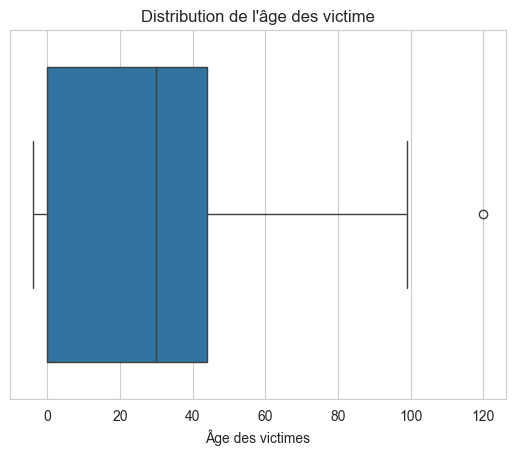

In [317]:
#vérification simple 
sns.boxplot(data,
            x=data["Vict Age"] )
plt.title("Distribution de l'âge des victime")
plt.xlabel("Âge des victimes")
plt.show()

In [318]:
#gestion de la valeur aberrante de variable Vict Age 
Q1=data["Vict Age"].dropna().quantile(0.25)
Q3=data["Vict Age"].dropna().quantile(0.75)
IQR=Q3-Q1
lower_bound=Q1-1.5*IQR
upper_bound=Q3+1.5*IQR

data["Vict Age"] = np.where(
    data["Vict Age"] < 0,
    0,
    np.where(
        data["Vict Age"] > upper_bound,
        upper_bound,
        data["Vict Age"]
    )
)

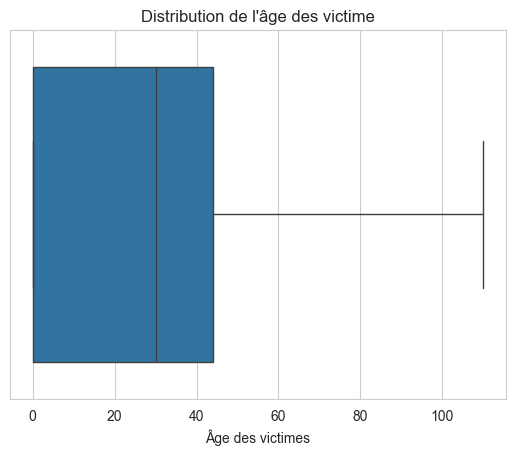

In [319]:
#vérification simple 
sns.boxplot(data,
            x=data["Vict Age"] )
plt.title("Distribution de l'âge des victime")
plt.xlabel("Âge des victimes")
plt.show()

### Transformation des données 

In [321]:
#Creation des nouvelles variables :
data["Years OCC"]=data["DATE OCC"].dt.year
data["Month OCC"]=data["DATE OCC"].dt.month
data["DAY OCC"]=data["DATE OCC"].dt.day
data["WeekDay OCC"]=data["DATE OCC"].dt.day_name()
data["Age_generation"]=pd.cut(data["Vict Age"],
                                 bins=[0,1,12,18,30,50,120],
                                 right=False,
                                 labels=["Âge inconnue","Enfant","Adolescent","Adulte","Personne agée","Senior"])

In [322]:
data.head(20)

,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,Mocodes,Vict Age,Vict Sex,Vict Descent,Premis Cd,Premis Desc,Weapon Used Cd,Weapon Desc,Status,Status Desc,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,LOCATION,Cross Street,LAT,LON,Years OCC,Month OCC,DAY OCC,WeekDay OCC,Age_generation
0,190326475,2020-01-03,2020-01-03,21:30:00,7,Wilshire,784,1,510,VEHICLE - STOLEN,NaN,0.0,M,O,101.0,STREET,-1.0,Unknown,AA,Adult Arrest,510.0,998.0,NaN,NaN,1900 S LONGWOOD AV,NaN,34.0375,-118.3506,2020,1,3,Friday,Âge inconnue
1,200106753,2020-09-02,2020-08-02,18:00:00,1,Central,182,1,330,BURGLARY FROM VEHICLE,1822 1402 0344,47.0,M,O,128.0,BUS STOP/LAYOVER (ALSO QUERY 124),-1.0,Unknown,IC,Invest Cont,330.0,998.0,NaN,NaN,1000 S FLOWER ST,NaN,34.0444,-118.2628,2020,8,2,Sunday,Personne agée
2,200320258,2020-11-11,2020-04-11,17:00:00,3,Southwest,356,1,480,BIKE - STOLEN,0344 1251,19.0,X,X,502.0,"MULTI-UNIT DWELLING (APARTMENT, DUPLEX, ETC)",-1.0,Unknown,IC,Invest Cont,480.0,NaN,NaN,NaN,1400 W 37TH ST,NaN,34.0210,-118.3002,2020,4,11,Saturday,Adulte
3,200907217,2023-10-05,2020-10-03,20:37:00,9,Van Nuys,964,1,343,SHOPLIFTING-GRAND THEFT ($950.01 & OVER),0325 1501,19.0,M,O,405.0,CLOTHING STORE,-1.0,Unknown,IC,Invest Cont,343.0,NaN,NaN,NaN,14000 RIVERSIDE DR,NaN,34.1576,-118.4387,2020,10,3,Saturday,Adulte
4,220614831,2022-08-18,2020-08-17,12:00:00,6,Hollywood,666,2,354,THEFT OF IDENTITY,1822 1501 0930 2004,28.0,M,H,102.0,SIDEWALK,-1.0,Unknown,IC,Invest Cont,354.0,NaN,NaN,NaN,1900 TRANSIENT,NaN,34.0944,-118.3277,2020,8,17,Monday,Adulte
5,231808869,2023-04-04,2020-01-12,23:00:00,18,Southeast,1826,2,354,THEFT OF IDENTITY,1822 0100 0930 0929,41.0,M,H,501.0,SINGLE FAMILY DWELLING,-1.0,Unknown,IC,Invest Cont,354.0,NaN,NaN,NaN,9900 COMPTON AV,NaN,33.9467,-118.2463,2020,1,12,Sunday,Personne agée
6,230110144,2023-04-04,2020-03-07,09:00:00,1,Central,182,2,354,THEFT OF IDENTITY,0930 0929,25.0,M,H,502.0,"MULTI-UNIT DWELLING (APARTMENT, DUPLEX, ETC)",-1.0,Unknown,IC,Invest Cont,354.0,NaN,NaN,NaN,1100 S GRAND AV,NaN,34.0415,-118.2620,2020,3,7,Saturday,Adulte
7,220314085,2022-07-22,2020-12-05,11:10:00,3,Southwest,303,2,354,THEFT OF IDENTITY,0100,27.0,F,B,248.0,CELL PHONE STORE,-1.0,Unknown,IC,Invest Cont,354.0,NaN,NaN,NaN,2500 S SYCAMORE AV,NaN,34.0335,-118.3537,2020,12,5,Saturday,Adulte
8,231309864,2023-04-28,2020-09-12,14:00:00,13,Newton,1375,2,354,THEFT OF IDENTITY,0100,24.0,F,B,750.0,CYBERSPACE,-1.0,Unknown,IC,Invest Cont,354.0,NaN,NaN,NaN,1300 E 57TH ST,NaN,33.9911,-118.2521,2020,9,12,Saturday,Adulte
9,211904005,2020-12-31,2020-12-31,12:20:00,19,Mission,1974,2,624,BATTERY - SIMPLE ASSAULT,0416,26.0,M,H,502.0,"MULTI-UNIT DWELLING (APARTMENT, DUPLEX, ETC)",400.0,"STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",IC,Invest Cont,624.0,NaN,NaN,NaN,9000 CEDROS AV,NaN,34.2336,-118.4535,2020,12,31,Thursday,Adulte


In [323]:
#Ajoutons une colonne delimitant une journée en trois tranche 
def assign_time(date):
    if pd.isnull(date):
        return None
    hours=date.hour
    if 5<=hours <12:
        return 'Matin'
    elif hours<17:
        return 'Après-Midi'
    elif hours<21:
        return 'Soir'
    else:
        return 'Nuit'
data["Periode_Journée OCC"]=data["TIME OCC"].apply(assign_time)
data.head()

,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,Mocodes,Vict Age,Vict Sex,Vict Descent,Premis Cd,Premis Desc,Weapon Used Cd,Weapon Desc,Status,Status Desc,Crm Cd 1,Crm Cd 2,Crm Cd 3,Crm Cd 4,LOCATION,Cross Street,LAT,LON,Years OCC,Month OCC,DAY OCC,WeekDay OCC,Age_generation,Periode_Journée OCC
0,190326475,2020-01-03,2020-01-03,21:30:00,7,Wilshire,784,1,510,VEHICLE - STOLEN,NaN,0.0,M,O,101.0,STREET,-1.0,Unknown,AA,Adult Arrest,510.0,998.0,NaN,NaN,1900 S LONGWOOD AV,NaN,34.0375,-118.3506,2020,1,3,Friday,Âge inconnue,Nuit
1,200106753,2020-09-02,2020-08-02,18:00:00,1,Central,182,1,330,BURGLARY FROM VEHICLE,1822 1402 0344,47.0,M,O,128.0,BUS STOP/LAYOVER (ALSO QUERY 124),-1.0,Unknown,IC,Invest Cont,330.0,998.0,NaN,NaN,1000 S FLOWER ST,NaN,34.0444,-118.2628,2020,8,2,Sunday,Personne agée,Soir
2,200320258,2020-11-11,2020-04-11,17:00:00,3,Southwest,356,1,480,BIKE - STOLEN,0344 1251,19.0,X,X,502.0,"MULTI-UNIT DWELLING (APARTMENT, DUPLEX, ETC)",-1.0,Unknown,IC,Invest Cont,480.0,NaN,NaN,NaN,1400 W 37TH ST,NaN,34.0210,-118.3002,2020,4,11,Saturday,Adulte,Soir
3,200907217,2023-10-05,2020-10-03,20:37:00,9,Van Nuys,964,1,343,SHOPLIFTING-GRAND THEFT ($950.01 & OVER),0325 1501,19.0,M,O,405.0,CLOTHING STORE,-1.0,Unknown,IC,Invest Cont,343.0,NaN,NaN,NaN,14000 RIVERSIDE DR,NaN,34.1576,-118.4387,2020,10,3,Saturday,Adulte,Soir
4,220614831,2022-08-18,2020-08-17,12:00:00,6,Hollywood,666,2,354,THEFT OF IDENTITY,1822 1501 0930 2004,28.0,M,H,102.0,SIDEWALK,-1.0,Unknown,IC,Invest Cont,354.0,NaN,NaN,NaN,1900 TRANSIENT,NaN,34.0944,-118.3277,2020,8,17,Monday,Adulte,Après-Midi


### Exploration des données

# definition des widgets necessaire pour definir les differents dashboard

In [326]:
import ipywidgets as widgets
from IPython.display import display

# Widgets de filtre
years = sorted(data['Years OCC'].dropna().unique())
sexes = sorted(data['Vict Sex'].dropna().unique())
crimes=sorted(data["Crm Cd Desc"].dropna().unique())
area=sorted(data["AREA NAME"].dropna().unique())

w_crime = widgets.Dropdown(options=[], description="Type de crime")
w_area = widgets.Dropdown(options=[], description="Zone")
w_year = widgets.Dropdown(options=['All'] + list(map(str, years)), description='Année:')
w_sex = widgets.Dropdown(options=['All'] + list(sexes), description='Sexe:')

# Choix de la dimension à analyser
dimension_options = ['Crm Cd Desc', 'AREA NAME',"Vict Age"]
w_dimension = widgets.Dropdown(options=dimension_options, description='Dimension:')
# Nouveau widget pour choisir le mode
w_top_mode = widgets.Dropdown(
    options=["Global", "Par année"],
    value="Global",
    description="Top 10 mode:"
)


## Analyse Demographique

### H2 explorons la repartion des victimes selon le sexe


In [329]:
data["Vict Sex"]=data["Vict Sex"].replace("-","Unknown")
data["Vict Sex"]=data["Vict Sex"].replace("H","M")
plt.figure(figsize=(15,7))
fig=px.pie(data["Vict Sex"].value_counts().reset_index(),values="count",names="Vict Sex",title="Repartition globale des victimes par sexe")
fig.show()

<Figure size 1500x700 with 0 Axes>

In [330]:

# Recalcul correct des pourcentages
counts = data.groupby(['Years OCC', 'Vict Sex']).size().reset_index(name='count')
total_per_year = counts.groupby('Years OCC')['count'].transform('sum')
counts['percentage'] = counts['count'] / total_per_year * 100

# Visualisation
plt.figure(figsize=(25,7))
fig = px.bar(
    counts,
    x='Years OCC',
    y='percentage',
    color='Vict Sex',
    barmode='group',
    title="Pourcentage de victimes par sexe selon l'année"
)

fig.update_xaxes(title="Année")
fig.update_yaxes(title="Pourcentage (%)")
fig.show()



<Figure size 2500x700 with 0 Axes>

In [331]:
#Evolution annuelle du nombre de victime selon le sexe 
plt.figure(figsize=(12,6))
fig=px.line(
    counts,
    color="Vict Sex",
    x="Years OCC",
    y="count",
    markers=True,
    title="Évolution annuelle du nombre de victimes selon le sexe"
)
fig.update_xaxes(title="Année")
fig.update_yaxes(title="Nombre de victime")
fig.show()


<Figure size 1200x600 with 0 Axes>

In [332]:
fig.update_layout(
    width=800,
    height=500
)

### Interprétation: 
* De facons globale on se rend compte que  les hommes sont les plus touchés sur toutes les années de collecte des données
* En observant la repartion selon chaque année on constate que les hommes demeurent plus nombreux que les femmes
* L'ecart entre les sexes semble être constant.

  
 On se demande dès lors si le sexe n'influencerait pas la probabilité d'être victime 

## Test d'independance de χ²
# Hypothèse nulle (H₀)

# H₀ : Le sexe de la victime est indépendant de l’année.
Cela signifie que la distribution des sexes parmi les victimes ne varie pas selon l’année.
Autrement dit, le sexe n’a aucun effet sur l’évolution annuelle du nombre de victimes.


# Hypothèse alternative (H₁)

# H₁ :  Le sexe de la victime dépend de l’année.
Cela implique qu’il existe une association statistiquement significative entre l’année et le sexe des victimes.
Autrement dit, la répartition des sexes parmi les victimes évolue au fil du temps



In [335]:
#test proprement dit 
from scipy.stats import chi2_contingency
tab=pd.crosstab(data["Vict Sex"],data["Years OCC"])
print(tab)
chi2,p,dof,expected=chi2_contingency(tab)
print("Chi2 =", chi2)
print("p-value =", p)
print("Degrees of freedom =", dof)
print("Expected frequencies :")
print(expected)

Years OCC   2020   2021   2022   2023   2024
Vict Sex                                    
F          72694  77061  89585  82886  30524
M          84993  88137  95756  91716  36279
Unknown    25484  28345  30086  31475  23056
X          16616  16262  19725  26053  15905
Chi2 = 13640.958058234919
p-value = 0.0
Degrees of freedom = 12
Expected frequencies :
[[71720.06807186 75316.35632858 84415.48973274 83330.64414362
  37967.4417232 ]
 [80692.65013871 84738.85419147 94976.34012933 93755.7742831
  42717.38125739]
 [28148.42393842 29559.88169601 33131.07552527 32705.29938797
  14901.31945233]
 [19225.85785101 20189.90778394 22629.09461267 22338.2821853
  10177.85756708]]


In [336]:
from statsmodels.stats.proportion import proportions_ztest

# Victimes observées
df_2022=data[data["Years OCC"]==2022]
n_female = (df_2022['Vict Sex'] == 'F').sum()
n_male = (df_2022['Vict Sex'] == 'M').sum()

# Population réelle 2022
N_female_pop = 1918000
N_male_pop = 1905000

# Test : comparaison des taux de victimisation
count = [n_female, n_male]
nobs = [N_female_pop, N_male_pop]

stat, p_value = proportions_ztest(count, nobs, alternative='larger')

print("Test de proportionnalité z-test (Femmes vs Hommes, taux de victimisation)\n")
print("H0 : taux de victimisation femmes = taux de victimisation hommes")
print("H1 : taux de victimisation femmes > taux de victimisation hommes\n")
print(f"Z = {stat:.2f} ; p-value = {p_value:.4f}")

Test de proportionnalité z-test (Femmes vs Hommes, taux de victimisation)

H0 : taux de victimisation femmes = taux de victimisation hommes
H1 : taux de victimisation femmes > taux de victimisation hommes

Z = -16.20 ; p-value = 1.0000


### Repartition du top 10 crime, top10 Zone criminogènes et de l'âge des victimes en fonctions du sexe et de l'année

In [338]:
out_dash=widgets.Output()

def update_dashboard(_=None):
    with out_dash:
        out_dash.clear_output(wait=True)
        df_f = data.copy()
        group_col = w_dimension.value

        # Vérification des colonnes
        for col in [group_col, "Years OCC", "Vict Sex"]:
            if col not in df_f.columns:
                print(f"La colonne '{col}' est absente du DataFrame.")
                return

        # Filtrage
        if w_year.value != "All":
            df_f = df_f[df_f["Years OCC"] == int(w_year.value)]
        if w_sex.value != "All":
            df_f = df_f[df_f["Vict Sex"] == w_sex.value]

        if df_f.empty:
            print("Aucun résultat après filtrage.")
            return

        # Cas particulier : Vict Age
        if group_col == "Vict Age":
            df_f = df_f[df_f["Vict Age"].notna()]
            fig = px.box(
                df_f,
                x="Vict Sex",
                y="Vict Age",
                color="Vict Sex",
                facet_col="Years OCC",
                title="Distribution de l'âge des victimes selon le sexe"
            )
            fig.show()
            return

        # --- Top 10 dynamique ---
        if w_top_mode.value == "Global":
            top_categories = df_f[group_col].value_counts().head(10).index
            df_top = df_f[df_f[group_col].isin(top_categories)]
        else:  # Top 10 par année
            df_counts = (
                df_f.groupby(["Years OCC", group_col])
                .size()
                .reset_index(name="Count")
                .sort_values(["Years OCC", "Count"], ascending=[True, False])
            )
            df_top = df_counts.groupby("Years OCC").head(10)

            # On doit réintégrer Vict Sex pour la visualisation
            df_top = df_f.merge(df_top[[ "Years OCC", group_col ]], on=["Years OCC", group_col])

        # Agrégation
        agg = (
            df_top.groupby(["Years OCC", "Vict Sex", group_col])
            .size()
            .reset_index(name="Nombre d’incidents")
        )

        # Visualisation
        fig = px.bar(
            agg,
            x=group_col,
            y="Nombre d’incidents",
            color="Vict Sex",
            barmode="group",
            facet_col="Years OCC",
            title=f"Top 10 '{group_col}' ({w_top_mode.value}) par année et sexe"
        )
        fig.update_xaxes(title=group_col, tickangle=45)
        fig.update_yaxes(title="Nombre d’incidents")
        fig.show()

# Lier les filtres
w_year.observe(update_dashboard, names="value")
w_sex.observe(update_dashboard, names="value")
w_dimension.observe(update_dashboard, names="value")
w_top_mode.observe(update_dashboard, names="value")

# Affichage
display(widgets.HBox([w_year, w_sex, w_dimension, w_top_mode]), out_dash)
update_dashboard()

Output()

### Croisement des top 10 des crimes et des top 10 des zones les plus touchées 

In [340]:


# Mise à jour des options selon l'année
def update_top10_widgets(change=None):
    df_f = data.copy()
    selected_year = w_year.value

    if selected_year != "All":
        df_f = df_f[df_f["Years OCC"] == int(selected_year)]

    # Top 10 crimes
    top_crimes = df_f["Crm Cd Desc"].value_counts().head(10).index.tolist()
    w_crime.options = ["All"] + top_crimes

    # Top 10 zones
    top_areas = df_f["AREA NAME"].value_counts().head(10).index.tolist()
    w_area.options = ["All"] + top_areas

# Lier la mise à jour au changement d’année
w_year.observe(update_top10_widgets, names="value")
update_top10_widgets()

# Conteneur de sortie
out_crime_zone = widgets.Output()

# Fonction principale
def update_dashboard_crime_zone(_=None):
    with out_crime_zone:
        out_crime_zone.clear_output(wait=True)
        df_f = data.copy()

        # Filtrage par année
        if w_year.value != 'All':
            df_f = df_f[df_f['Years OCC'] == int(w_year.value)]
        if w_crime.value != "All":
            df_f = df_f[df_f['Crm Cd Desc'] == w_crime.value]
        if w_area.value != "All":
            df_f = df_f[df_f['AREA NAME'] == w_area.value]

        if df_f.empty:
            print("Aucun résultat après filtrage.")
            return

        # Agrégation croisée par année
        agg_list = []
        for year in df_f["Years OCC"].unique():
            df_year = df_f[df_f["Years OCC"] == year]
            top_crimes = df_year["Crm Cd Desc"].value_counts().head(10).index
            top_zones = df_year["AREA NAME"].value_counts().head(10).index
            df_top = df_year[
                df_year["Crm Cd Desc"].isin(top_crimes) &
                df_year["AREA NAME"].isin(top_zones)
            ]
            agg = (
                df_top
                .groupby(["Years OCC", "AREA NAME", "Crm Cd Desc"])
                .size()
                .reset_index(name="Nombre d'incidents")
            )
            agg_list.append(agg)

        # Fusion de toutes les années
        agg_all = pd.concat(agg_list, ignore_index=True)

        # Visualisation
        fig = px.bar(
            agg_all,
            x='Crm Cd Desc',
            y="Nombre d'incidents",
            color='AREA NAME',
            barmode='group',
            facet_col='Years OCC' if w_year.value == 'All' else None,
            title="Top 10 crimes dans les 10 zones les plus touchées"
        )
        fig.update_xaxes(title="Type de crime", tickangle=45)
        fig.update_yaxes(title="Nombre d’incidents")
        fig.show()

# Lier les filtres
w_year.observe(update_dashboard_crime_zone, names='value')
w_crime.observe(update_dashboard_crime_zone, names='value')
w_area.observe(update_dashboard_crime_zone, names='value')

# Affichage
display(widgets.VBox([w_year, w_crime, w_area, out_crime_zone]))
update_dashboard_crime_zone()

### - "Model de regression logistiques afin de predire le sexe d'une victime en fonction de certaines caractérisque"


In [342]:

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, roc_auc_score, confusion_matrix, classification_report

# 1. Préparation des données
df = data.copy()

# Garder uniquement F et M
df = df[df['Vict Sex'].isin(['F', 'M'])]

# Supprimer les valeurs manquantes
df = df.dropna(subset=['Vict Age', 'AREA NAME', 'Crm Cd Desc'])

# Encoder la cible : 1 = Femme, 0 = Homme
df['Vict_Sex_Binary'] = (df['Vict Sex'] == 'F').astype(int)

# 2. Encodage des variables catégorielles
categorical_features = ['AREA NAME', 'Crm Cd Desc']
encoder = OneHotEncoder(handle_unknown='ignore', sparse_output=False)
X_cat = encoder.fit_transform(df[categorical_features])
X_num = df[['Vict Age']].values

# Concaténer variables numériques et catégorielles
X = np.hstack([X_num, X_cat])
y = df['Vict_Sex_Binary']

# 3. Split train/test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)

# 4. Modèle de régression logistique
log_reg = LogisticRegression(max_iter=1000)
log_reg.fit(X_train, y_train)

# 5. Évaluation
y_pred = log_reg.predict(X_test)
y_prob = log_reg.predict_proba(X_test)[:,1]

print("Accuracy:", accuracy_score(y_test, y_pred))
print("AUC:", roc_auc_score(y_test, y_prob))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

# 6. Interprétation des coefficients
feature_names = ['Vict Age'] + list(encoder.get_feature_names_out(categorical_features))
coef_df = pd.DataFrame({
    'Feature': feature_names,
    'Coefficient': log_reg.coef_[0]
}).sort_values(by='Coefficient', ascending=False)

print("\nTop facteurs associés aux femmes (coefficients positifs):")
print(coef_df.head(10))

print("\nTop facteurs associés aux hommes (coefficients négatifs):")
print(coef_df.tail(10))

Accuracy: 0.6326826448485926
AUC: 0.6825162852035084
Confusion Matrix:
 [[93522 25543]
 [57063 48762]]
Classification Report:
               precision    recall  f1-score   support

           0       0.62      0.79      0.69    119065
           1       0.66      0.46      0.54    105825

    accuracy                           0.63    224890
   macro avg       0.64      0.62      0.62    224890
weighted avg       0.64      0.63      0.62    224890


Top facteurs associés aux femmes (coefficients positifs):
                                               Feature  Coefficient
116                         Crm Cd Desc_RAPE, FORCIBLE     4.735798
87   Crm Cd Desc_HUMAN TRAFFICKING - COMMERCIAL SEX...     3.106896
115                        Crm Cd Desc_RAPE, ATTEMPTED     2.854048
29             Crm Cd Desc_BATTERY WITH SEXUAL CONTACT     2.408526
122  Crm Cd Desc_SEX,UNLAWFUL(INC MUTUAL CONSENT, P...     2.256673
123    Crm Cd Desc_SEXUAL PENETRATION W/FOREIGN OBJECT     2.016801
130        

Puisque la p-value est est nulle l'hypothèse H0 est rejetté c'est-à-dire que la distribution des victimes depend statistiquement du sexe de ces derniers autrement dit 
il existe une association statistiquement significative entre le sexe des victimes et l'année. Ces distributtion ne sont pas dues au hasard

### repartition globale  des top 10 crimes selon le sexe

In [345]:
crime_sex = data.groupby(['Vict Sex', 'Crm Cd Desc']).size().reset_index(name='Nombre d’incidents')
crime_sex_top10 = (
    crime_sex
    .groupby(["Vict Sex", "Crm Cd Desc"])['Nombre d’incidents']
    .sum()
    .reset_index(name='Nombre d’incidents')
    .sort_values(by='Nombre d’incidents', ascending=False)
    .head(10)
)

# Visualisation :
fig = px.bar(crime_sex_top10, 
             x='Crm Cd Desc', 
             y='Nombre d’incidents', 
             color='Vict Sex',
             title="Répartition globale des top10 crimes par sexe")
fig.update_xaxes(title="Type de crime")
fig.update_yaxes(title="Nombre d’incidents")
fig.show()

# top 10 des zones les plus criminogènes par année

In [347]:
# Comptage des incidents par année et zone
crime_zone_year = (
    data.groupby(["Years OCC", "AREA NAME"])
    .size()
    .reset_index(name="Nombre d'incidents")
)

# Top 10 des zones par année
top10_zones_per_year = (
    crime_zone_year
    .sort_values(["Years OCC", "Nombre d'incidents"], ascending=[True, False])
    .groupby("Years OCC")
    .head(10)   # garde les 10 premières zones par année
)

fig1=px.bar(
    top10_zones_per_year,
    x="Years OCC",
    y="Nombre d'incidents",
    color="AREA NAME",
    barmode="group",
    title="Top 10 des zones criminogènes par année"
)
fig1.update_xaxes(title="Zone", tickangle=45)
fig1.update_yaxes(title="Nombre d'incidents")
fig1.show()



In [348]:
crime_zone_year = (
    data.groupby(["Years OCC", "AREA NAME"])
    .size()
    .reset_index(name="Nombre d'incidents")
)

top10_zone = (
    crime_zone_year
    .groupby(["AREA NAME","Years OCC"])["Nombre d'incidents"]
    .sum()
    .reset_index(name="count")
    .sort_values(by="count", ascending=False)  # top 10 zones les plus touchées
    .head(10)
)

fig=px.bar(
    top10_zone,
    x="Years OCC",
    y="count",
    color="AREA NAME",
)
fig.show()


In [573]:
crime_sex_zone = (
    data
    .groupby(['AREA NAME', 'Vict Sex'])
    .size()
    .reset_index(name='Nombre d’incidents')
)
#recuperons le 10 zones les plus touchées selon le sexe 
top10_crime_zone=(
    crime_sex_zone
    .groupby(["AREA NAME"])['Nombre d’incidents']
    .sum()
    .reset_index(name='Total incidents')
    .sort_values(by='Total incidents', ascending=False)

    .head(10)
)
print(top10_crime_zone)
top10_zone=top10_crime_zone["AREA NAME"]
crime_sex_zone_top10=crime_sex_zone[crime_sex_zone["AREA NAME"].isin(top10_zone)]



      AREA NAME  Total incidents
1       Central            67774
0   77th Street            60865
12      Pacific            57810
15    Southwest            55978
6     Hollywood            51324
8   N Hollywood            49978
14    Southeast            49119
11      Olympic            49023
9        Newton            48268
20     Wilshire            47090


### Repartition des incidents selon le top 10 des zones les plus criminogènes

In [351]:
fig=px.bar(
    top10_crime_zone,
    x="AREA NAME",
    y="Total incidents",
    barmode="group",
    title="Repartition des incidents des top 10 zones les plus ciminogènes"
)
fig.update_xaxes(title="Zone géographique")
fig.update_yaxes(title="Nombre de victimes")
fig.show()

###  Repartion globale des incidents par sexe dans les 10 zones les plus criminogènes

In [353]:
fig=px.bar(
    crime_sex_zone_top10,
    x="AREA NAME",
    y='Nombre d’incidents',
    color="Vict Sex",
    barmode="group",
    title="Repartion des incidents par sexe dans les 10 zones les plus criminogènes"
)
fig.update_xaxes(title="Zone géographique")
fig.update_yaxes(title="Nombre d'incidents")
fig.show()

### Analyse exploratoire par rapport à l'âge

## Distribution statistiques globale de le variable âge

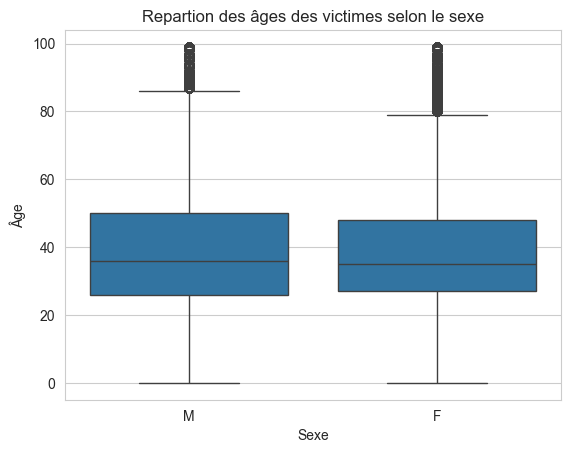

In [357]:
sns.boxplot(data=data, x=data[(data["Vict Sex"]=="F")|(data["Vict Sex"]=="M")]["Vict Sex"],y=data["Vict Age"])
plt.title("Repartion des âges des victimes selon le sexe")
plt.xlabel("Sexe")
plt.ylabel("Âge")
plt.show()

In [358]:
print("Mesure globale de tendance centrales et de dispersions\n")
print("Moyenne d'âge des victimes en fonction du sexe \n")
moyenne_femme=data[data["Vict Sex"]=="F"]["Vict Age"].mean()
moyenne_homme=data[data["Vict Sex"]=="M"]["Vict Age"].mean()
print(f"Les victimes de sexe masculin ont en moyenne {moyenne_homme:.2f} ans\n")
print(f"Les victimes de sexe feminin ont en moyenne {moyenne_femme:.2f} ans\n")

Mesure globale de tendance centrales et de dispersions

Moyenne d'âge des victimes en fonction du sexe 

Les victimes de sexe masculin ont en moyenne 37.34 ans

Les victimes de sexe feminin ont en moyenne 38.30 ans



In [359]:
print("Mesure de tendances centrale et de dispersion par année\n")
df_age=data[(data["Vict Sex"]=="M")|(data["Vict Sex"]=="F")]
data_age=df_age.groupby(["Years OCC","Vict Sex"])["Vict Age"]
data_age.describe()

Mesure de tendances centrale et de dispersion par année



count       mean        std  min   25%   50%   75%   max
Years OCC Vict Sex                                                            
2020      F         72694.0  38.262016  16.206823  0.0  27.0  35.0  49.0  99.0
          M         84993.0  37.528220  18.439214  0.0  27.0  37.0  50.0  99.0
2021      F         77061.0  38.312843  16.017615  0.0  27.0  36.0  49.0  99.0
          M         88137.0  37.659961  18.204094  0.0  27.0  36.0  50.0  99.0
2022      F         89585.0  38.079690  15.863249  0.0  27.0  35.0  48.0  99.0
          M         95756.0  37.487144  18.514710  0.0  27.0  36.0  50.0  99.0
2023      F         82886.0  38.503390  16.280594  0.0  27.0  35.0  49.0  99.0
          M         91716.0  37.265559  18.756962  0.0  26.0  36.0  50.0  99.0
2024      F         30524.0  38.432447  15.882140  0.0  27.0  35.0  48.0  99.0
          M         36279.0  35.917032  19.020637  0.0  25.0  35.0  49.0  99.0

### Repartion annuelle des incidents par sexe dans les 10 zones les plus criminogènes selon une année précise

## Repartition annuelle des top 10 des crimes par sexe

## Repartition annuelle des ages selon le sexe

### Repartition des victimes selon la catégorie d'âge

In [362]:
fig=px.pie(data["Age_generation"].value_counts().reset_index(),values="count",names="Age_generation",title="Repartition globale des victimes par categorie d'âge")
fig.show()

### Repartition globale des victimes par categorie d'âge par année

C:\Users\brice\AppData\Local\Temp\ipykernel_21960\2619769242.py:1: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\brice\anaconda3\Lib\site-packages\plotly\express\_core.py:1727: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



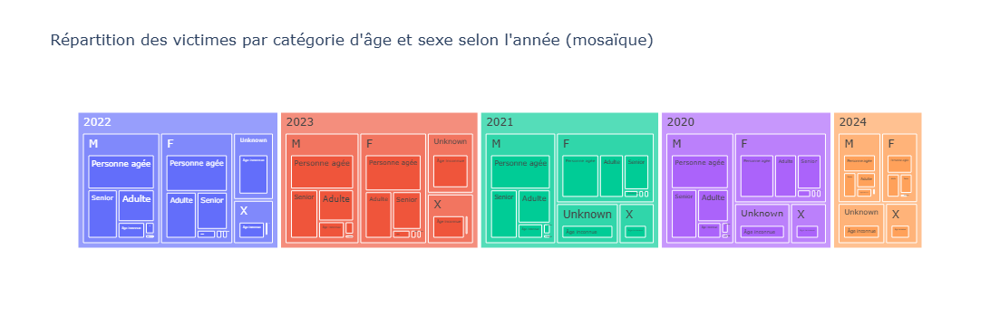

In [555]:

data_age_year=data.groupby(["Years OCC","Age_generation","Vict Sex"]).size().reset_index(name="count")
fig = px.treemap(
    data_age_year,
    path=["Years OCC", "Vict Sex", "Age_generation"],
    values="count",
    title="Répartition des victimes par catégorie d'âge et sexe selon l'année (mosaïque)"
)
fig.show()

In [365]:
data_age_year2=data.groupby(["Years OCC","Age_generation"]).size().reset_index(name="count")
fig=px.bar(
    data_age_year2,
    x="Years OCC",
    y="count",
    color="Age_generation",
    barmode="group",
    title="Repartition des victimes par catégorie d'âge selon l'année"
)
fig.update_xaxes(title="Année")
fig.update_yaxes(title="count")

C:\Users\brice\AppData\Local\Temp\ipykernel_21960\2978912314.py:1: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



### Repartition globale des victime selon le top 10 des crime  et la generation d'âge

C:\Users\brice\AppData\Local\Temp\ipykernel_21960\13452293.py:6: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



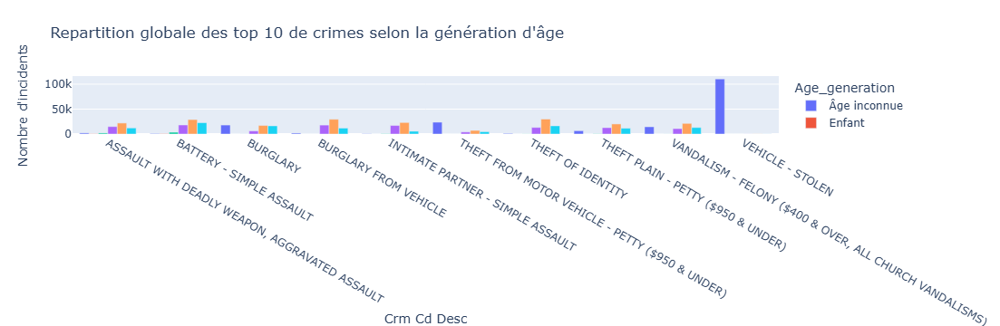

In [563]:
#filtrage de crime 
crimes_generation=data["Crm Cd Desc"].value_counts().head(10).index
top_crimes=data[data["Crm Cd Desc"].isin(crimes_generation)]
top_crime_generation=(
    top_crimes
    .groupby(["Age_generation","Crm Cd Desc"])
    .size()
    .reset_index(name="Nombre d'incidents")
)
#Visualisation
fig=px.bar(
    top_crime_generation,
    x="Crm Cd Desc",
    y="Nombre d'incidents",
    barmode="group",
    color="Age_generation",
    title="Repartition globale des top 10 de crimes selon la génération d'âge"
)
fig.show()

### Repartition annuelle du top 10 des crimes selon la generation d'âge

### Repartition annuelle des top 10 zones les plus touchée selon la génération d'âge 

### repartion annuelle de la generation d'age selon les âge réel des victimes 

### 

In [370]:
generation = sorted(data['Age_generation'].dropna().unique())
w_generation = widgets.Dropdown(options=['All'] + list(generation), description='Génération:')
choix_options = ['Crm Cd Desc']
w_choix = widgets.Dropdown(options=choix_options, description='Variable:')
out_dash2 = widgets.Output()
def update_dashboard2(_=None):
    with out_dash2:
        out_dash2.clear_output(wait=True)
        df_f = data.copy()
        group_col = w_choix.value
        

        # Vérification des colonnes
        for col in [group_col, 'Years OCC', 'Age_generation']:
            if col not in df_f.columns:
                print(f"La colonne '{col}' est absente du DataFrame.")
                return

        # Filtrage
        if w_year.value != 'All':
            df_f = df_f[df_f['Years OCC'] == int(w_year.value)]
        if w_generation.value != 'All':
            df_f = df_f[df_f['Age_generation'] == w_generation.value]

        if df_f.empty:
            print("Aucun résultat après filtrage.")
            return
        agg_list = []

        for year in df_f['Years OCC'].unique():
            df_year = df_f[df_f['Years OCC'] == year]
        
            top_crimes = df_year['Crm Cd Desc'].value_counts().head(10).index
            df_top = df_year[df_year['Crm Cd Desc'].isin(top_crimes)]
        
            agg = (
                df_top
                .groupby(['Years OCC', 'Age_generation', 'Crm Cd Desc'])
                .size()
                .reset_index(name='Nombre d’incidents')
            )
            agg_list.append(agg)
        
        agg_all = pd.concat(agg_list, ignore_index=True)

        

        # Visualisation
        fig = px.bar(
            agg_all,
            x=group_col,
            y='Nombre d’incidents',
            color='Age_generation',
            barmode='group',
            facet_col='Years OCC',
            title=f"Top 10 '{group_col}' par année et sexe"
        )
        fig.update_xaxes(title=group_col, tickangle=45)
        fig.update_yaxes(title="Nombre d’incidents")
        fig.show()

# Lier les filtres
w_year.observe(update_dashboard2, names='value')
w_generation.observe(update_dashboard2, names='value')
w_choix.observe(update_dashboard2, names='value')

# Affichage
display(widgets.HBox([w_year, w_generation, w_choix]), out_dash2)
update_dashboard2()

Output()

In [371]:
group_col = w_dimension.value
print(group_col)

Crm Cd Desc


### Dashboard interactif : Top 10 zones par année, sexe et génération

In [483]:
out_zone = widgets.Output()

def update_zone_dashboard(_=None):
    with out_zone:
        out_zone.clear_output(wait=True)
        df_f = data.copy()

        # Filtrage
        if w_year.value != 'All':
            df_f = df_f[df_f['Years OCC'] == int(w_year.value)]
        if w_sex.value != 'All':
            df_f = df_f[df_f['Vict Sex'] == w_sex.value]
        if w_generation.value != 'All':
            df_f = df_f[df_f['Age_generation'] == w_generation.value]

        if df_f.empty:
            print(" Aucun résultat après filtrage.")
            return
        
        # --- Début de la modification pour le titre ---
        if w_generation.value != 'All':
            generation_title = f"Génération: {w_generation.value}"
        else:
            generation_title = "par Âge/Génération"
        
        # Le titre utilise maintenant la variable generation_title
        chart_title = f"Top 10 zones par Année et Sexe ({generation_title})"
        # --- Fin de la modification pour le titre ---

        # Top 10 zones
        top_zones = df_f['AREA NAME'].value_counts().head(10).index
        df_top = df_f[df_f['AREA NAME'].isin(top_zones)]

        # Agrégation
        agg = (
            df_top
            .groupby(['Years OCC', 'Vict Sex', 'Age_generation', 'AREA NAME'])
            .size()
            .reset_index(name='Nombre d’incidents')
        )

        # Visualisation
        fig = px.bar(
            agg,
            x='AREA NAME',
            y='Nombre d’incidents',
            color='Vict Sex',
            # Ajout du facet_col seulement si 'All' est sélectionné pour voir la répartition
            facet_col='Age_generation' if w_generation.value == 'All' else None, 
            facet_row='Years OCC' if w_year.value == 'All' else None,
            barmode='group',
            title=chart_title # Utilisation du titre dynamique
        )
        fig.update_xaxes(title="Zone géographique", tickangle=45)
        fig.update_yaxes(title="Nombre d’incidents")
        fig.show()

# Lier les widgets (inchangé)
w_year.observe(update_zone_dashboard, names='value')
w_sex.observe(update_zone_dashboard, names='value')
w_generation.observe(update_zone_dashboard, names='value')

# Affichage (inchangé)
display(widgets.VBox([widgets.HBox([w_year, w_sex, w_generation]), out_zone]))
update_zone_dashboard()

### Dashboard 2 : Top 10 crimes par année, sexe et génération

In [375]:

out_crime = widgets.Output()

def update_crime_dashboard(_=None):
    with out_crime:
        out_crime.clear_output(wait=True)
        df_f = data.copy()

        # Filtrage
        if w_year.value != 'All':
            df_f = df_f[df_f['Years OCC'] == int(w_year.value)]
        if w_sex.value != 'All':
            df_f = df_f[df_f['Vict Sex'] == w_sex.value]
        if w_generation.value != 'All':
            df_f = df_f[df_f['Age_generation'] == w_generation.value]

        if df_f.empty:
            print(" Aucun résultat après filtrage.")
            return

        # Top 10 crimes
        top_crimes = df_f['Crm Cd Desc'].value_counts().head(10).index
        df_top = df_f[df_f['Crm Cd Desc'].isin(top_crimes)]

        # Agrégation
        agg = (
            df_top
            .groupby(['Years OCC', 'Vict Sex', 'Age_generation', 'Crm Cd Desc'])
            .size()
            .reset_index(name='Nombre d’incidents')
        )

        # Visualisation
        fig = px.bar(
            agg,
            x='Crm Cd Desc',
            y='Nombre d’incidents',
            color='Vict Sex',
            facet_col='Age_generation' if w_generation.value == 'All' else None,
            facet_row='Years OCC' if w_year.value == 'All' else None,
            barmode='group',
            title="Top 10 crimes par année, sexe et génération"
        )
        fig.update_xaxes(title="Type de crime", tickangle=45)
        fig.update_yaxes(title="Nombre d’incidents")
        fig.show()

# Lier les widgets
w_year.observe(update_crime_dashboard, names='value')
w_sex.observe(update_crime_dashboard, names='value')
w_generation.observe(update_crime_dashboard, names='value')

# Affichage
display(widgets.VBox([widgets.HBox([w_year, w_sex, w_generation]), out_crime]))
update_crime_dashboard()

In [377]:
data["Month OCC"].unique()

array([ 1,  8,  4, 10,  3, 12,  9,  2, 11,  5,  6,  7])

#### H1- SAISONNALITÉ

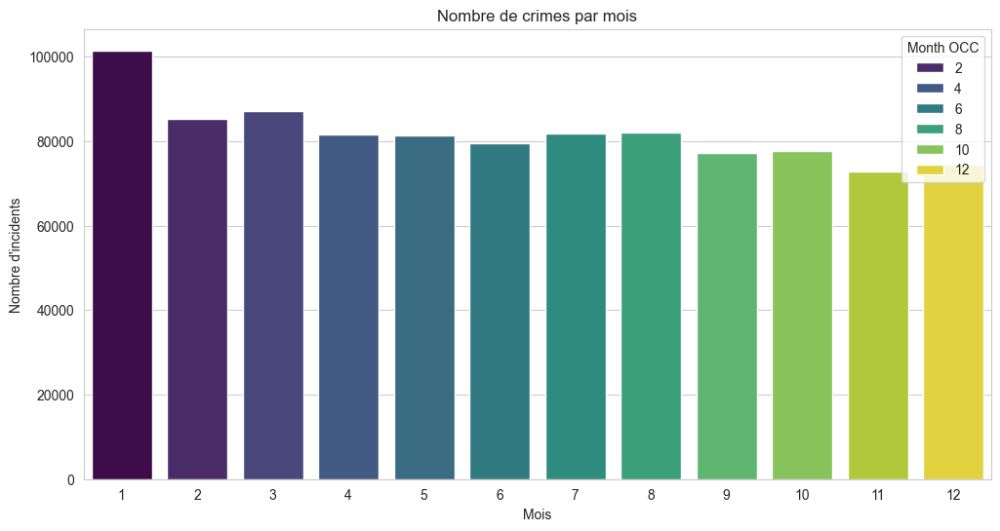

In [379]:
monthly=data.groupby("Month OCC").size()
plt.figure(figsize=(12,6))
sns.barplot(x=monthly.index,hue=monthly.index,y=monthly.values,palette="viridis")
plt.title("Nombre de crimes par mois")
plt.xlabel("Mois")
plt.ylabel("Nombre d'incidents")
plt.show()


In [380]:
# evolution mensuelle des crimes parr année
monthly_yearly_counts = data.groupby(['Years OCC', 'Month OCC']).size().reset_index(name='Nombre d’incidents')
fig = px.line(monthly_yearly_counts,
              x='Month OCC', y='Nombre d’incidents',
              color='Years OCC',
              title="Évolution mensuelle des crimes par année",
              markers=True)

fig.update_xaxes(title="Mois")
fig.update_yaxes(title="Nombre d’incidents")
fig.show()

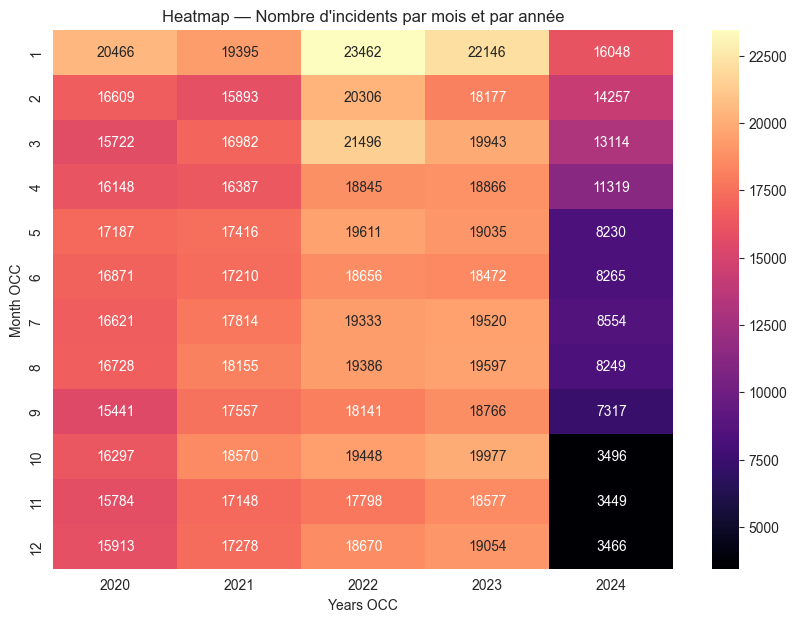

In [381]:
monthly_year = data.pivot_table(index='Month OCC', columns="Years OCC", values="DR_NO", aggfunc="count")

plt.figure(figsize=(10,7))
sns.heatmap(monthly_year, cmap="magma", annot=True, fmt="g")
plt.title("Heatmap — Nombre d'incidents par mois et par année")
plt.show()


### - H₀ (hypothèse nulle) : La répartition des crimes par mois est indépendante de l’année → pas de saisonnalité stable.

# - H₁ (hypothèse alternative) : La répartition mensuelle des crimes est stable d’une année à l’autre → présence d’une saisonnalité.


In [383]:
#Effectuons un test de chi2 d'ajustement pour savoir si le mois de janvier est significativement
#plus dangereux que les autres mois
from scipy.stats import chisquare
print("H0 : Les crimes sont répartis uniformément entre les 12 mois (pas de saisonnalité)\n")
print("H1 : Les crimes ne sont pas répartis uniformément (saisonnalité présente)\n")
#nombre de crime par mois 
obs=data.groupby("Month OCC").size().values
#distribution théorique du crime 
expected=np.repeat(np.mean(obs),12)
#test du chi-deux
stat,p=chisquare(f_obs=obs,f_exp=expected)

print("Statistique du chi-deux:", stat)
print("p-value:", p)
if p<0.05:
    print("\nHypothèse nulle rejettée \n")
    print("La distribution mensuelle est significativement différente d’une distribution uniforme\n")
    print("Les crimes présentent une saisonnalité")
else:
    print("On ne rejette pas H0\n")
    print("Pas de preuve statistique de saisonnalité")


H0 : Les crimes sont répartis uniformément entre les 12 mois (pas de saisonnalité)

H1 : Les crimes ne sont pas répartis uniformément (saisonnalité présente)

Statistique du chi-deux: 7447.574032349655
p-value: 0.0

Hypothèse nulle rejettée 

La distribution mensuelle est significativement différente d’une distribution uniforme

Les crimes présentent une saisonnalité


## test de levene d'égalité des variances 

In [386]:
#distribution des age selon le sexe 
ages_m = data[data["Vict Sex"] == "M"]["Vict Age"].dropna()
ages_f = data[data["Vict Sex"] == "F"]["Vict Age"].dropna()
# Moyennes
mean_m = ages_m.mean()
mean_f = ages_f.mean()
#statistique selon les anneeé
mean_m_years=data[data["Vict Sex"] == "M"].groupby("Years OCC")["Vict Age"].mean().reset_index(name="Moyenne d'âge des hommes")
mean_f_years=data[data["Vict Sex"] == "F"].groupby("Years OCC")["Vict Age"].mean().reset_index(name="Moyenne d'âge des femmes")
moy_years=mean_m_years.merge(
    mean_f_years,
    on="Years OCC",
    how="left"
)
moy_years.head()

,Years OCC,Moyenne d'âge des hommes,Moyenne d'âge des femmes
0,2020,37.528220,38.262016
1,2021,37.659961,38.312843
2,2022,37.487144,38.079690
3,2023,37.265559,38.503390
4,2024,35.917032,38.432447


In [387]:
from scipy.stats import levene
#test de levene
stat, p_value = levene(ages_m, ages_f)
print("Test de Levene d'égalité de deux variances\n")
print("H0: les âge des victimes sont indentiquement distribuée chez les hommes et femmes\n")
print("H1: la variance sont signifiquativement differente\n")

print(f"Statistique de Levene = {stat:.2f}, p-value = {p_value:.4f}")


Test de Levene d'égalité de deux variances

H0: les âge des victimes sont indentiquement distribuée chez les hommes et femmes

H1: la variance sont signifiquativement differente

Statistique de Levene = 5551.35, p-value = 0.0000


In [388]:
#t test 
from scipy.stats import ttest_ind
stat, p_value=ttest_ind(ages_m,ages_f,equal_var=False)
#Affichage des resultats

print("Welch's t-test (variances inégales)")
print("Hypothèses de tests")
print("H0(hypothèse nulle): Aucune différence significative d'âge moyen entre les victimes hommes et femmes .\n")
print("H1(hypothèse alternative) La différence d'âge moyen entre hommes et femmes est statistiquement significative.\n")

print(f"Statistique t = {stat:.2f}, p-value = {p_value:.4f}")
if p_value < 0.05:
    print("\n* La différence d'âge moyen entre hommes et femmes est statistiquement significative.\n")
    print("* les femmes et les hommes n’ont pas le même profil d’âge moyen en tant que victimes\n")
else:
    print("Aucune différence significative d'âge moyen entre hommes et femmes n'a été détectée.\n")
print("Comparaison globale des âges moyens des victimes selon le sexe: \n")
print(f"Âge moyen des victimes masculines : {mean_m:.2f} ans\n")
print(f"Âge moyen des victimes féminines : {mean_f:.2f} ans\n")



Welch's t-test (variances inégales)
Hypothèses de tests
H0(hypothèse nulle): Aucune différence significative d'âge moyen entre les victimes hommes et femmes .

H1(hypothèse alternative) La différence d'âge moyen entre hommes et femmes est statistiquement significative.

Statistique t = -23.98, p-value = 0.0000

* La différence d'âge moyen entre hommes et femmes est statistiquement significative.

* les femmes et les hommes n’ont pas le même profil d’âge moyen en tant que victimes

Comparaison globale des âges moyens des victimes selon le sexe: 

Âge moyen des victimes masculines : 37.34 ans

Âge moyen des victimes féminines : 38.30 ans



In [393]:
### test de chi2 d'independance entre la tranche d'âge selon le sexe et l'année du crime 


# Filtrer les victimes masculines avec âge et année valides
df_m = data[(data['Vict Sex'] == 'M') & data['Age_generation'].notna() & data['Years OCC'].notna()]

# Table de contingence : Année × Tranche d’âge
contingency = pd.crosstab(df_m['Years OCC'], df_m['Age_generation'])

# Test du chi²
chi2, p, dof, expected = chi2_contingency(contingency)

print(" Test du chi² d’indépendance (sexe masculin)\n")
print("Hypothèses\n")
print("H0: La Tranche d'âge des victimes de sexe masculin ne varie pas\n")
print("H1: La répartition des tranches d’âge varie significativement selon l’année.\n ")
print(f"Statistique χ² = {chi2:.2f}, p-value = {p:.4f}")

if p < 0.05:
    print("La répartition des tranches d’âge varie significativement selon l’année.")
else:
    print("La répartition des tranches d’âge est stable d’une année à l’autre.")

 Test du chi² d’indépendance (sexe masculin)

Hypothèses

H0: La Tranche d'âge des victimes de sexe masculin ne varie pas

H1: La répartition des tranches d’âge varie significativement selon l’année.
 
Statistique χ² = 599.26, p-value = 0.0000
La répartition des tranches d’âge varie significativement selon l’année.


In [394]:
df_m = data[(data['Vict Sex'] == 'F') & data['Age_generation'].notna() & data['Years OCC'].notna()]

# Table de contingence : Année × Tranche d’âge
contingency = pd.crosstab(df_m['Years OCC'], df_m['Age_generation'])

# Test du chi²
chi2, p, dof, expected = chi2_contingency(contingency)

print(" Test du chi² d’indépendance (sexe Féminin)\n")
print("Hypothèses\n")
print("H0: La Tranche d'âge des victimes de sexe féminin ne varie pas\n")
print("H1: La répartition des tranches d’âge varie significativement selon l’année.\n ")
print(f"Statistique χ² = {chi2:.2f}, p-value = {p:.4f}")

if p < 0.05:
    print("La répartition des tranches d’âge varie significativement selon l’année.")
else:
    print("La répartition des tranches d’âge est stable d’une année à l’autre.")

 Test du chi² d’indépendance (sexe Féminin)

Hypothèses

H0: La Tranche d'âge des victimes de sexe féminin ne varie pas

H1: La répartition des tranches d’âge varie significativement selon l’année.
 
Statistique χ² = 268.62, p-value = 0.0000
La répartition des tranches d’âge varie significativement selon l’année.


###  quel est la generation d'age la plus touchée a central 

In [398]:
central=data[data["AREA NAME"]=="Central"]
fig=px.pie(central["Age_generation"].value_counts().reset_index(),values="count",names="Age_generation",title="Repartition globale des victimes par categorie d'âge dans la ville Central")
fig.show()

In [399]:
# Sélection des 10 zones les plus touchées
top_zones = data['AREA NAME'].value_counts().head(10).index
df_top = data[data['AREA NAME'].isin(top_zones)]

# Table de contingence : Zone × Génération d’âge
contingency = pd.crosstab(df_top['AREA NAME'], df_top['Age_generation'])

# Test du chi²
chi2, p, dof, expected = chi2_contingency(contingency)

print("Test du chi² d’indépendance : Zone × Génération d’âge\n")
print("Hypothèses du test \n")
print("- H₀ (nulle) : la génération d’âge est indépendante de la zone géographique\n")
print("- H₁ (alternative) : la génération d’âge dépend de la zone (certaines zones touchent plus certaines générations)\n")
print(f"Statistique χ² = {chi2:.2f}")
print(f"p-value = {p:.4f}")
print(f"Degrés de liberté = {dof}\n")

if p < 0.05:
    print("Hypothès nulle rejettée \n")
    print("Il existe une association significative entre la zone et la génération d’âge.")
else:
    
    print("Aucune association significative détectée entre la zone et la génération d’âge.")


Test du chi² d’indépendance : Zone × Génération d’âge

Hypothèses du test 

- H₀ (nulle) : la génération d’âge est indépendante de la zone géographique

- H₁ (alternative) : la génération d’âge dépend de la zone (certaines zones touchent plus certaines générations)

Statistique χ² = 13982.00
p-value = 0.0000
Degrés de liberté = 45

Hypothès nulle rejettée 

Il existe une association significative entre la zone et la génération d’âge.


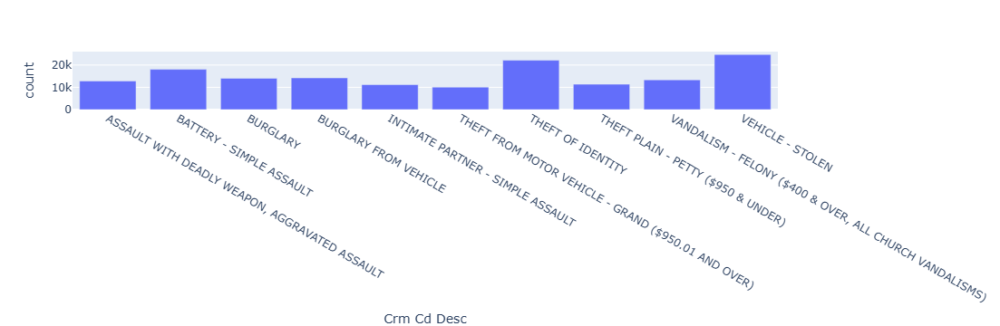

In [597]:
#top 10 crime cas 2022
df_2022=data[data["Years OCC"]==2022]
crimes=df_2022["Crm Cd Desc"].value_counts().head(10).index
top=df_2022[df_2022["Crm Cd Desc"].isin(crimes)]
#Visualisation
agg=top.groupby("Crm Cd Desc").size().reset_index(name="count")
figure=px.bar(agg,
             x="Crm Cd Desc",
             y="count")
figure.show()


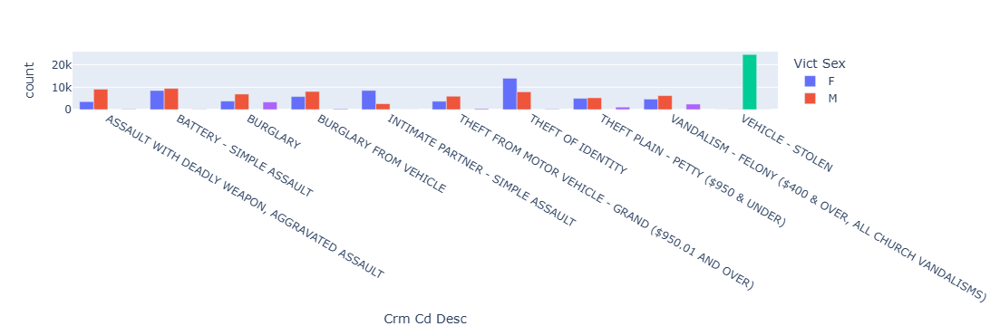

In [603]:
agg_2=top.groupby(["Crm Cd Desc","Vict Sex"]).size().reset_index(name="count")
figure=px.bar(agg_2,
             x="Crm Cd Desc",
             y="count",
             color="Vict Sex",
             barmode="group")
figure.show()

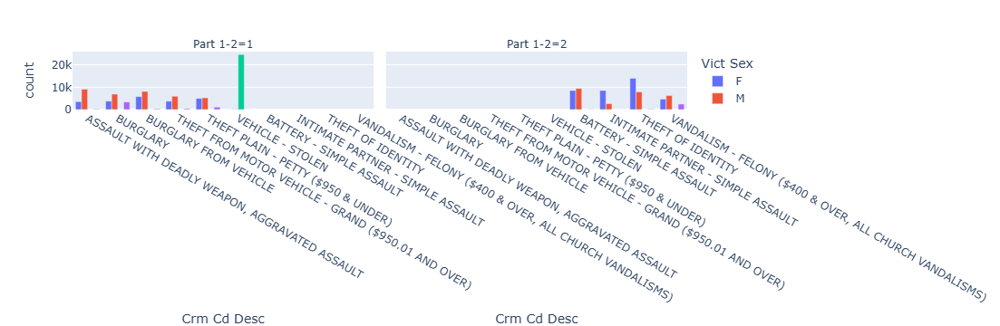

In [605]:
agg_3=top.groupby(["Crm Cd Desc","Vict Sex","Part 1-2"]).size().reset_index(name="count")
figure=px.bar(agg_3,
             x="Crm Cd Desc",
             y="count",
             color="Vict Sex",
              facet_col="Part 1-2",
             barmode="group")
figure.show()

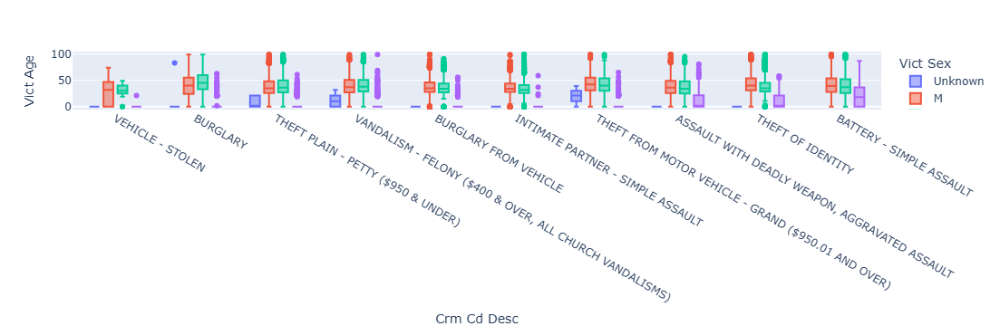

In [633]:
fig=px.box(top,x="Crm Cd Desc",y="Vict Age",color="Vict Sex")
fig.show()

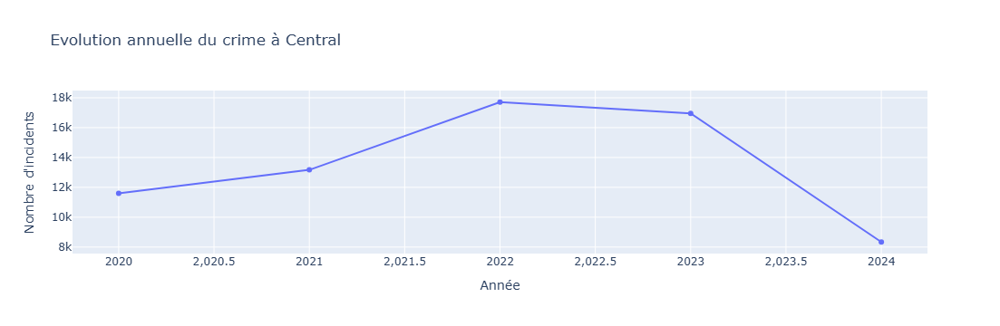

In [653]:
central=data[data["AREA NAME"]=="Central"]
compt=central.groupby("Years OCC").size().reset_index(name="count")
fig=px.line(compt,x="Years OCC",y="count",markers=True,title="Evolution annuelle du crime à Central ")
fig.update_xaxes(title="Année")
fig.update_yaxes(title="Nombre d'incidents")
fig.show()

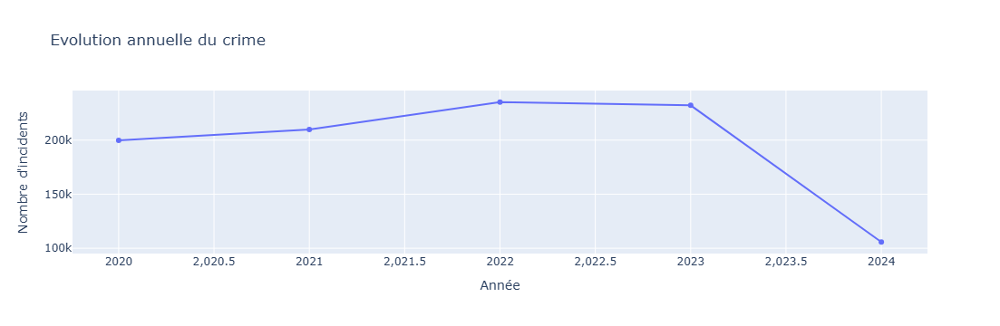

In [655]:
crime_evolution = data.groupby('Years OCC').size().reset_index(name='count')
fig=px.line(crime_evolution,x="Years OCC",y="count",markers=True,title="Evolution annuelle du crime")
fig.update_xaxes(title="Année")
fig.update_yaxes(title="Nombre d'incidents")
fig.show()
